In [ ]:
#default_exp supervision

# Create the supervisory signal for learning the waveform

Here we'll be using the distinctive brightness of the white foam to indicate where the peak of wave energy is. 

Using calibration paramters for shirahama


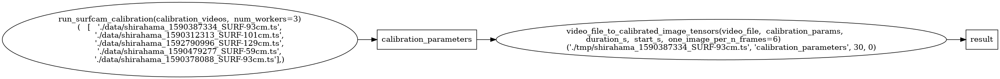

In [ ]:
%load_ext autoreload
%autoreload 2
from surfbreak import graphutils
import pipelines
import graphchain
import dask
import matplotlib.pyplot as plt

# These tensors are 10hz by default (1/6th of the frames from a of 60Hz video)
img_tensor_graph = pipelines.video_to_calibrated_image_tensor('./tmp/shirahama_1590387334_SURF-93cm.ts',
                                                                duration_s=30, start_s=0)
graphutils.visualize(img_tensor_graph)

Load in a calibrated wave video to work with

(139, 1515, 300)


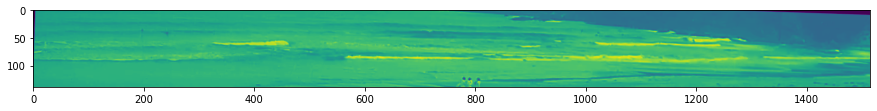

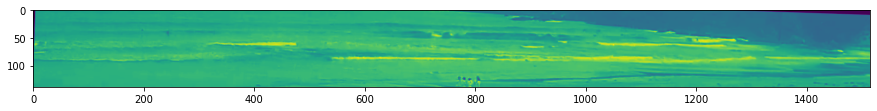

In [ ]:
img_tensor = graphchain.get(img_tensor_graph, 'result')
print(img_tensor.shape)
for frame_idx in range(2):
    plt.figure(figsize=(15,5))
    plt.imshow(img_tensor[:,:,frame_idx*5])
    plt.show()

## Animation convenience functions

In [ ]:
#export
import numpy as np
from matplotlib import animation
from IPython.display import HTML
import matplotlib.pyplot as plt

def animate_tensor(image_tensor, colorbar=True):
    tensor_aspect = image_tensor.shape[0] / image_tensor.shape[1]
    if tensor_aspect < 1:
        figsize = (20, tensor_aspect*20)
    else:
        figsize = (5/tensor_aspect, 5 + 1)
    fig, ax = plt.subplots(figsize=figsize)
    img = ax.imshow(image_tensor[..., 0])
    
    norm = plt.Normalize()
    colors = plt.cm.jet(norm(image_tensor))
    if colorbar:
        plt.colorbar(img, norm=colors, fraction=0.046, pad=0.04)
    def animate(i):
        img.set_data(image_tensor[... ,i])
        
    plt.rcParams["animation.embed_limit"] = 100.0 #100 MB max video size
    ani = animation.FuncAnimation(fig, animate, interval=100, frames=image_tensor.shape[-1])
    plt.close()
    return HTML(ani.to_jshtml())

def show_image(img):
    plt.figure(figsize=(20,2))
    plt.imshow(img)
    plt.colorbar()

In [ ]:
animate_tensor(img_tensor[...,::5])

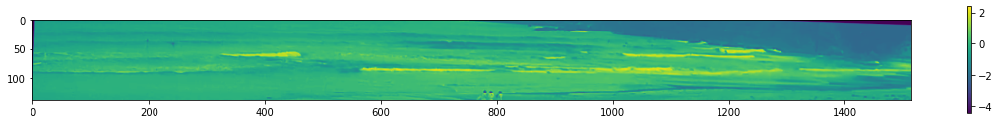

In [ ]:
norm_tensor = (img_tensor - img_tensor.mean()) / img_tensor.std()
show_image(norm_tensor[...,0])

## Transform the image tensor to highlight foam wavefronts

In [ ]:
#export
import cv2

def wavefront_diff_tensor(image_tensor):
    norm_tensor = (image_tensor - image_tensor.mean()) / image_tensor.std()
    """Averages sets of 2 frames over the time dimension, then finds the differences between them"""
    frames_offset_3_right =  norm_tensor[...,3:]
    frames_offset_2_right =  norm_tensor[...,2:-1]
    frames_offset_1_right =  norm_tensor[...,1:-2]
    frames_offset_zero =     norm_tensor[...,0:-3]

    # Right is future frames, left is past frames
    right_avg = (frames_offset_3_right + frames_offset_2_right) / 2
    left_avg  = (frames_offset_1_right + frames_offset_zero) / 2
    
    # Positive values indicate a change from dark -> bright (e.g. the foam of the wave-front)
    time_diff = right_avg - left_avg
    # keep only positive (wave front), and clip this to max 1 standard deviation of image brightness from the original normalized greyscale
    return time_diff.clip(min=0, max=1)  

def dilate_tensor(image_tensor, erode_size=2, dilation_size=5, clip_range=(0.1, 1)):
    """Dilates the image tensor with a 2x bias for the horizontal (to emphasize horizontally-aligned wavefronts)"""
    dilated_tensor = np.zeros_like(image_tensor)
    for idx in range(dilated_tensor.shape[-1]):
        # Erode uniformly
        if erode_size > 0:
            erode_element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (erode_size, erode_size))
            eroded_tensor = cv2.erode(image_tensor[...,idx], erode_element);
        else: eroded_tensor = image_tensor[...,idx]
            
        eroded_tensor = eroded_tensor.clip(min=clip_range[0], max=clip_range[1])

        # Favor horizontal direction in dilation
        dilate_element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*dilation_size, dilation_size))
        dilated_tensor[...,idx] = cv2.dilate(eroded_tensor, dilate_element)
    return dilated_tensor

def vertical_waveform_slice(wavefront_tensor, xrange=(30,50), output_dim=2):
    if output_dim == 2:
        return wavefront_tensor[:,xrange[0]:xrange[1]].mean(axis=1)
    elif output_dim == 3:
        return wavefront_tensor[:,xrange[0]:xrange[1]]

In [ ]:
# The raw wavefront tensor
wavefront_tensor = wavefront_diff_tensor(img_tensor) 
animate_tensor(wavefront_tensor[...,::5])

In [ ]:
# And the dilated version
dilated_wavefront = dilate_tensor(wavefront_tensor)
animate_tensor(dilated_wavefront[...,::5])

### Create a plot of the vertical wave propagation over time
By averaging a vertical slice in the horizontal direction, we can create a 2-d image which shows wavefront propagation

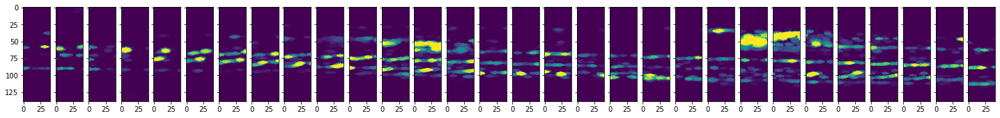

In [ ]:
n_timesteps = 30
fig, axes = plt.subplots(ncols=n_timesteps, figsize=(25,3), sharey=True)
for t_idx in range(n_timesteps):
    axes[t_idx].imshow(dilated_wavefront[:,30:70,5*t_idx])

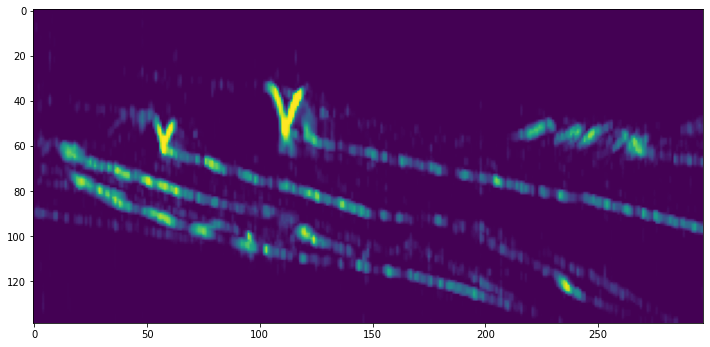

In [ ]:
vertical_wave_slice = vertical_waveform_slice(dilated_wavefront)
plt.figure(figsize=(12,30))
plt.imshow(vertical_wave_slice)

## Create pipeline function to generate waveform slices 

In [ ]:
#export
def generate_waveform_slice(image_tensor, slice_xrange=(30,50), output_dim=2):
    dtensor = dilate_tensor(wavefront_diff_tensor(image_tensor)).astype('float32')
    return vertical_waveform_slice(dtensor, xrange=slice_xrange, output_dim=output_dim)


In [ ]:
import nbdev.export as export
export.notebook2script()

Converted 00_load_videos.ipynb.
Converted 01_wave_modeling.ipynb.
Converted 02_wave_detection.ipynb.
Converted 03_perspective_transform.ipynb.
Converted 04_graph_utilities.ipynb.
Converted 05_waveform_supervision.ipynb.
Converted 06_learn_1d_waveform.ipynb.
Converted 07_learn_2d_waveform.ipynb.
Converted index.ipynb.
